<a href="https://colab.research.google.com/github/Kimi-chuheng/Laptop-Price-Prediction/blob/main/Laptop_Price_Prediction%26Apartment_price_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Regression

In [ ]:
#import packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split,KFold, cross_val_score
import statsmodels.api as sm
from sklearn.decomposition import PCA

In [ ]:
#Import the file
df_laptop=pd.read_csv('laptop_prices.csv')

pd.set_option('display.max_columns', None)

df_laptop.head(5)

,Company,TypeName,Inches,Ram,OS,Weight,Price_euros,Screen,ScreenW,ScreenH,Touchscreen,IPSpanel,RetinaDisplay,CPU_company,CPU_freq,CPU_model,PrimaryStorage,SecondaryStorage,PrimaryStorageType,SecondaryStorageType,GPU_company,GPU_model
0,Apple,Ultrabook,13.3,8,macOS,1.37,1339.69,Standard,2560,1600,No,Yes,Yes,Intel,2.3,Core i5,128,0,SSD,No,Intel,Iris Plus Graphics 640
1,Apple,Ultrabook,13.3,8,macOS,1.34,898.94,Standard,1440,900,No,No,No,Intel,1.8,Core i5,128,0,Flash Storage,No,Intel,HD Graphics 6000
2,HP,Notebook,15.6,8,No OS,1.86,575.00,Full HD,1920,1080,No,No,No,Intel,2.5,Core i5 7200U,256,0,SSD,No,Intel,HD Graphics 620
3,Apple,Ultrabook,15.4,16,macOS,1.83,2537.45,Standard,2880,1800,No,Yes,Yes,Intel,2.7,Core i7,512,0,SSD,No,AMD,Radeon Pro 455
4,Apple,Ultrabook,13.3,8,macOS,1.37,1803.60,Standard,2560,1600,No,Yes,Yes,Intel,3.1,Core i5,256,0,SSD,No,Intel,Iris Plus Graphics 650


##Data Cleaning

### Pivot Tables

In [ ]:
#rearrange columns
categorical_features = ['Company','TypeName','OS','Screen','Touchscreen','IPSpanel','RetinaDisplay','CPU_company','CPU_model','PrimaryStorageType','SecondaryStorageType','GPU_company','GPU_model']
all_columns = df_laptop.columns.tolist()

numerical_features = [col for col in all_columns if col not in categorical_features]
#numerical_features1 = [col for col in all_columns if col not in categorical_features]
numerical_features.remove('Price_euros')

for feature in categorical_features:
  df_laptop[feature]=df_laptop[feature].astype('category')
print(categorical_features)
print(numerical_features)

['Company', 'TypeName', 'OS', 'Screen', 'Touchscreen', 'IPSpanel', 'RetinaDisplay', 'CPU_company', 'CPU_model', 'PrimaryStorageType', 'SecondaryStorageType', 'GPU_company', 'GPU_model']
['Inches', 'Ram', 'Weight', 'ScreenW', 'ScreenH', 'CPU_freq', 'PrimaryStorage', 'SecondaryStorage']


In [ ]:
df_laptop.pivot_table(values='Price_euros',columns='Screen',index='TypeName',observed=False)

Screen,4K Ultra HD,Full HD,Quad HD+,Standard
TypeName,,,,
2 in 1 Convertible,1941.857143,1228.642500,1660.157143,1196.506296
Gaming,2832.750769,1647.467037,NaN,2778.500000
Netbook,NaN,1677.500000,NaN,461.989474
Notebook,2390.645455,906.887885,1154.666667,541.855693
Ultrabook,2004.750000,1493.220325,1677.202222,1602.253556
Workstation,2877.750000,2198.267500,NaN,1860.990000


###Structuring data

In [ ]:
#remove duplicate samples
df_laptop.drop_duplicates(inplace=True)
df_laptop.duplicated().sum()

0

In [ ]:
#check for missing values
df_laptop.isnull().sum()

,0
Company,0
TypeName,0
Inches,0
Ram,0
OS,0
Weight,0
Price_euros,4
Screen,0
ScreenW,0
ScreenH,0


In [ ]:
#Remove the missing values
df_laptop = df_laptop.dropna()

In [ ]:
#Calculate and display the correlation matrix between the specified columns of the DataFrame
df_laptop[numerical_features].corr()

,Inches,Ram,Weight,ScreenW,ScreenH,CPU_freq,PrimaryStorage,SecondaryStorage
Inches,1.000000,0.241926,0.192313,-0.067708,0.010349,0.306025,0.259066,0.390393
Ram,0.241926,1.000000,0.118889,0.424264,0.046369,0.365675,0.014228,0.390147
Weight,0.192313,0.118889,1.000000,-0.017979,0.880383,0.102082,0.018213,0.148194
ScreenW,-0.067708,0.424264,-0.017979,1.000000,0.012291,0.177537,-0.074088,0.145959
ScreenH,0.010349,0.046369,0.880383,0.012291,1.000000,0.035135,-0.015391,0.058752
CPU_freq,0.306025,0.365675,0.102082,0.177537,0.035135,1.000000,0.051942,0.223669
PrimaryStorage,0.259066,0.014228,0.018213,-0.074088,-0.015391,0.051942,1.000000,-0.244110
SecondaryStorage,0.390393,0.390147,0.148194,0.145959,0.058752,0.223669,-0.244110,1.000000


##Data Exploration

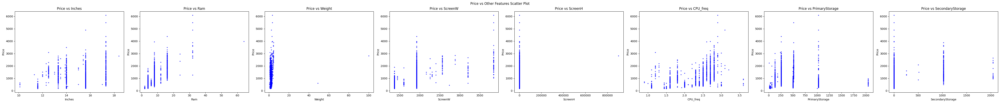

In [ ]:
#Scatter plots between  numerical features and price
num_features = len(numerical_features)
fig, axes = plt.subplots(nrows=1, ncols=num_features, figsize=(50, 5), squeeze=False)


for i, feature in enumerate(numerical_features):
    axes[0, i].scatter(df_laptop[feature], df_laptop['Price_euros'], alpha=0.7, color='blue', s=5)
    axes[0, i].set_title(f'Price vs {feature}')
    axes[0, i].set_xlabel(feature)
    axes[0, i].set_ylabel('Price')

plt.tight_layout()
plt.suptitle('Price vs Other Features Scatter Plot', y=1.02)
plt.show();

**Summary for numerical features**

In fact, many of these numerical features are also discrete in nature, similar to categorical features. I only observed a clear positive correlation with price in CPU frequency and RAM.

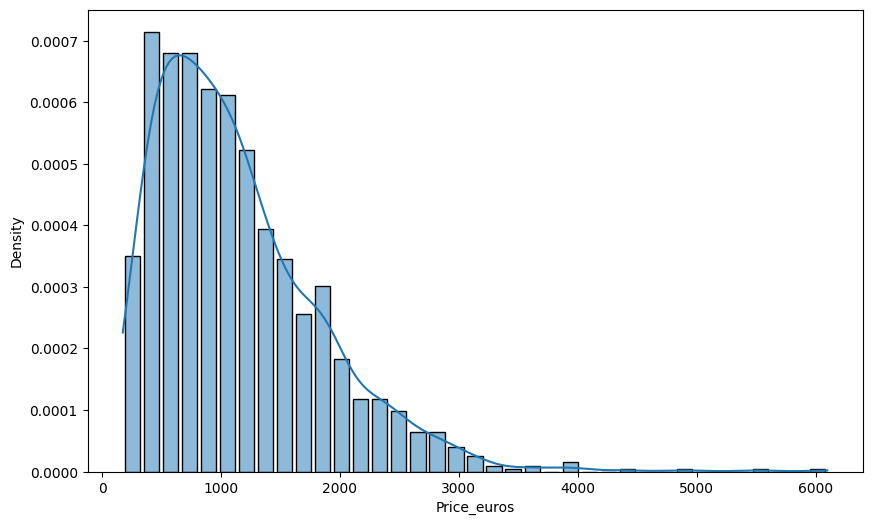

In [ ]:
#Hist-plot of price with density
plt.figure(figsize=(10, 6))
sns.histplot(x='Price_euros',data=df_laptop,shrink=0.8,stat='density',kde=True);

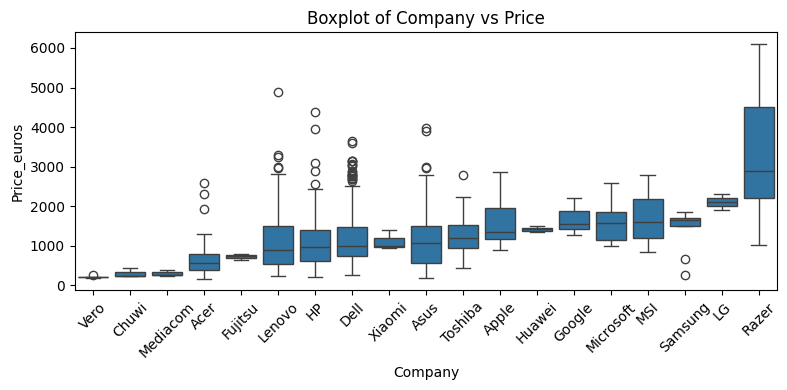

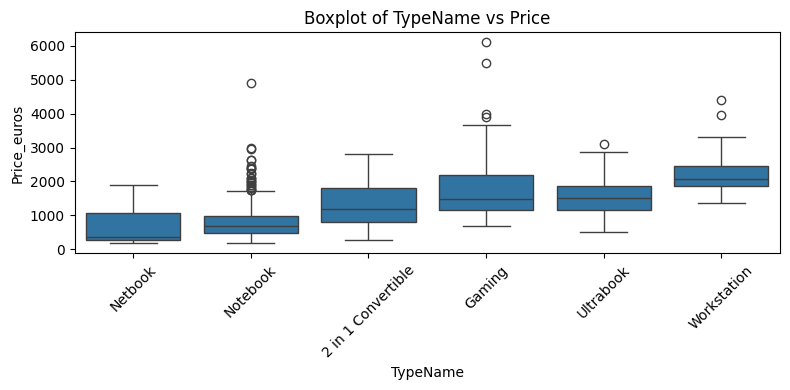

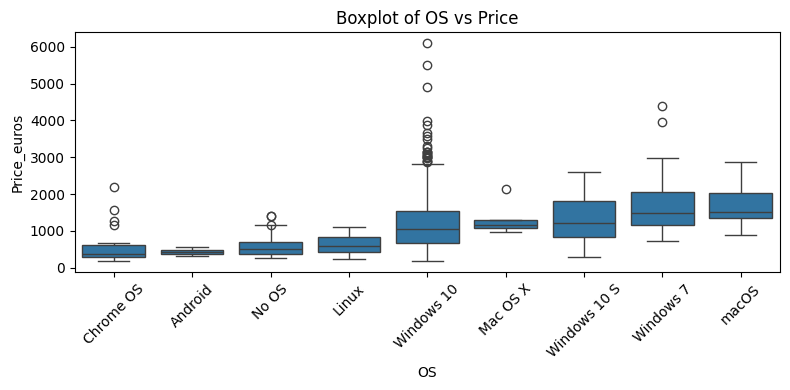

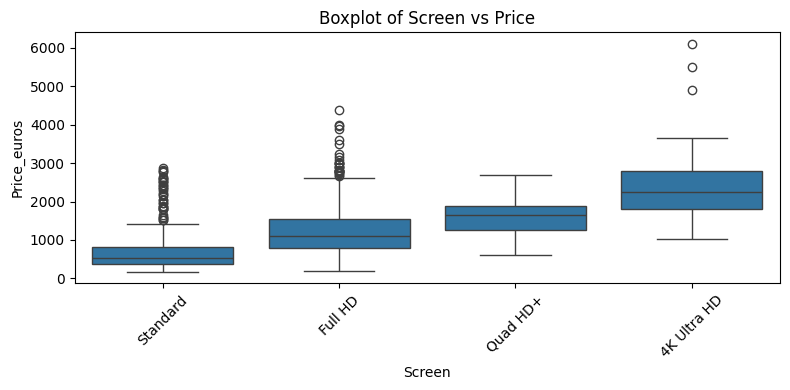

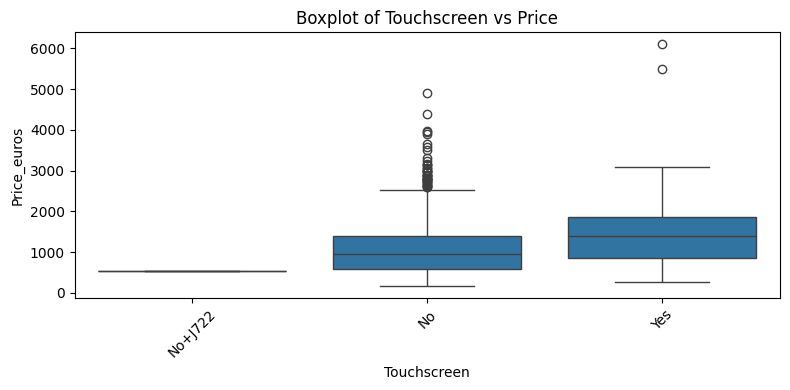

...

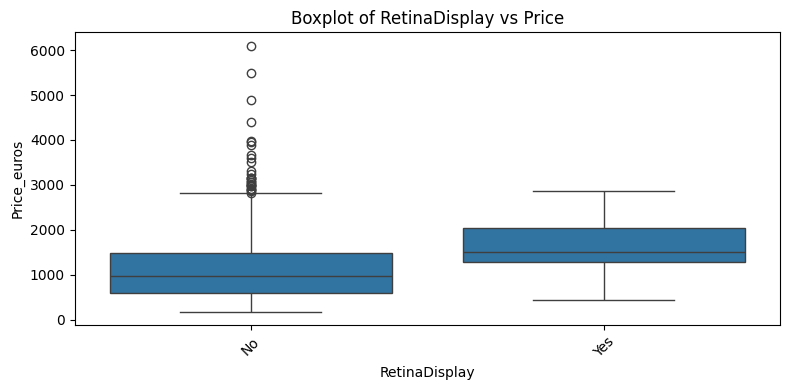

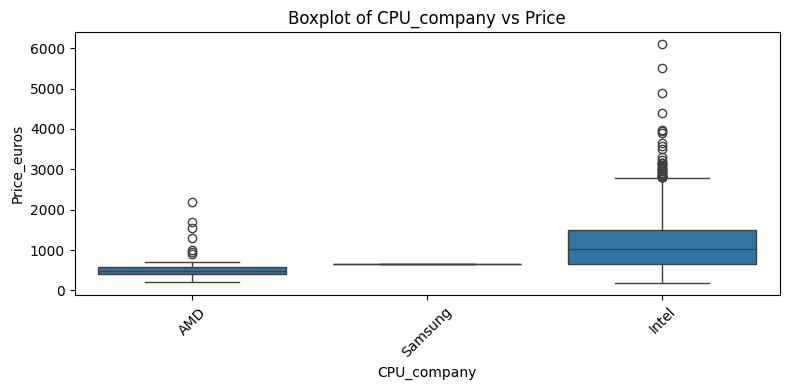

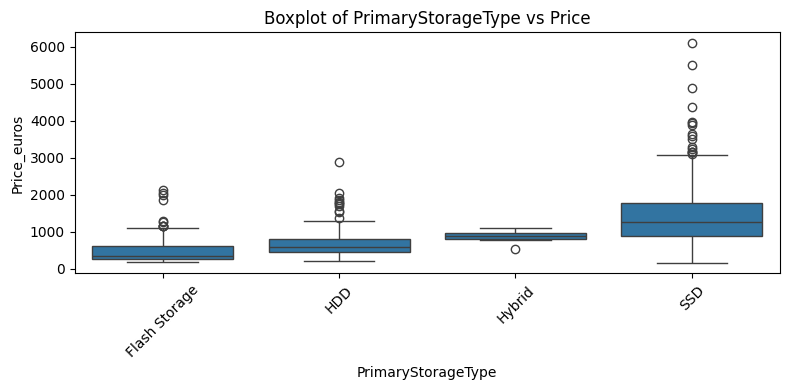

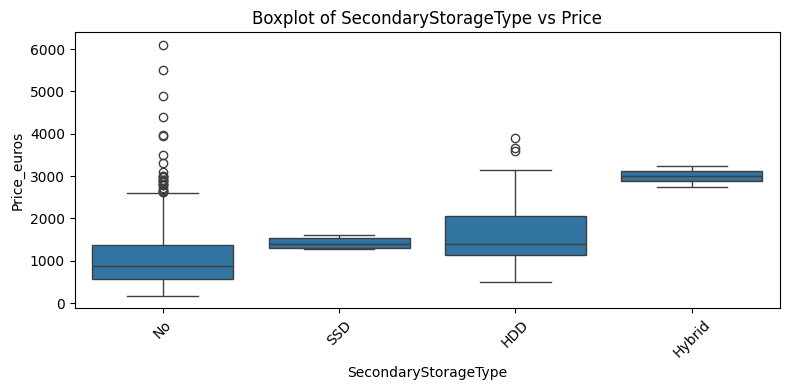

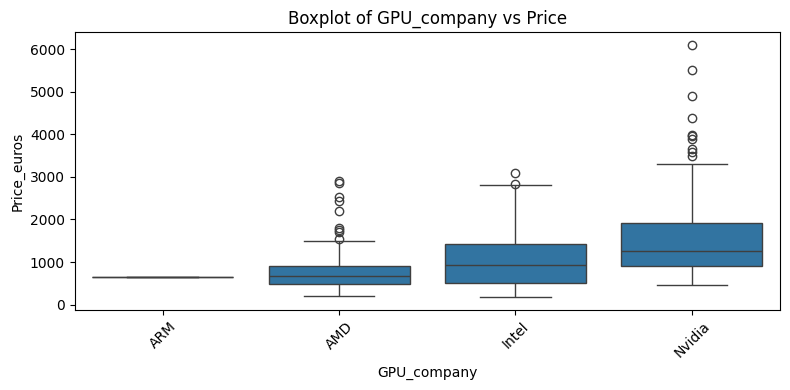

In [ ]:
#Boxplot of categorical features & price

exclude_features = ['CPU_model', 'GPU_model']
dispersion_categorical_features = [
    feature for feature in categorical_features
    if feature not in exclude_features
]

for feature in dispersion_categorical_features:

    medians = df_laptop.groupby(feature,observed=False)['Price_euros'].median().sort_values()
    order = medians.index.tolist()
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=df_laptop, x=feature, y='Price_euros', order=order)
    plt.xticks(rotation=45)
    plt.title(f'Boxplot of {feature} vs Price')
    plt.tight_layout()
    plt.show();

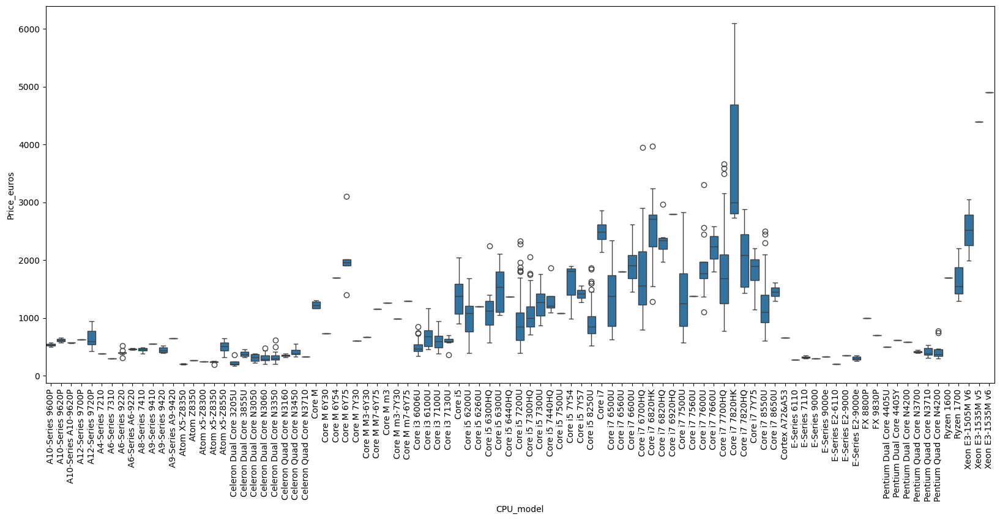

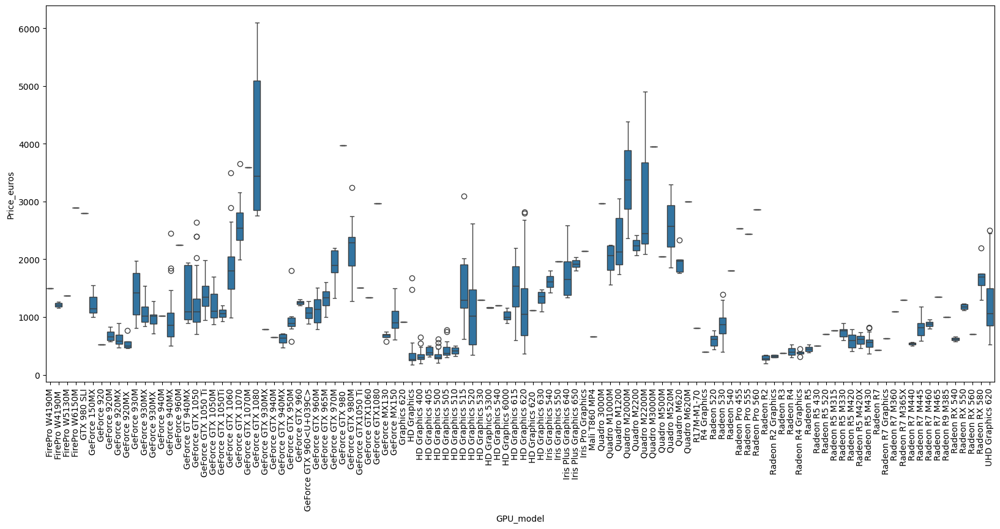

In [ ]:
plt.figure(figsize=(20, 8))
sns.boxplot(data=df_laptop,x='CPU_model',y='Price_euros')
plt.xticks(rotation=90);

plt.figure(figsize=(20, 8))
sns.boxplot(data=df_laptop,x='GPU_model',y='Price_euros')
plt.xticks(rotation=90);

**Summary for categorical features:**
1. Brand (Company)
Price ranking from lowest to highest:

Cheaper Brands: Vero, Chuwi, Mediacom, Acer, Fujitsu

Mid-range Brands: Lenovo, HP, Dell, Xiaomi, Asus, Toshiba

More Expensive Brands: Apple, Huawei, Google, Microsoft, MSI, Samsung, LG, Razer


---


2. Type (Typename)

Price ranking:

Lowest Price: Netbook

Mid-low Price: Notebook, 2 in 1 Convertible

Mid-high Price: Gaming

Highest Price: Ultrabook, Workstation


---


3. Operating System (OS)

Price ranking:

Lowest Price: Chrome OS, Android, No OS, Linux

Mid-range Price: Windows 10, Windows 10 S, Windows 7

Higher Price: Mac OS X, macOS


---


4. Screen

Price ranking:

Lowest Price: Standard

Mid-range Price: Full HD

Higher Price: Quad HD+, 4K Ultra HD


---


5. Touchscreen

Devices with Touchscreen: Generally more expensive.

Devices without Touchscreen: Relatively cheaper.


---


6. Panel Type

Devices with IPS Panel: Typically more expensive.

Devices without IPS Panel: Priced lower.


---


7. Retina Display:

Devices with Retina Display: Typically more expensive.

Devices without Retina Display: Priced lower.


---


8. CPU Manufacturer

Price ranking:

Cheaper Manufacturers: AMD, Samsung

Mid-range Price: Intel

More Expensive Manufacturers: ARM, Nvidia


---


9. Primary Storage Type

Price ranking:

Lowest Price: Flash Storage

Mid-range Price: HDD

Higher Price: Hybrid, SSD


---


10. Secondary Storage Type

Price ranking:

Lowest Price: No

Mid-range Price: HDD

Higher Price: Hybrid, SSD

##Preform
* Company: Laptop Manufacturer.
* Product: Brand and Model.
* TypeName: Laptop Type (Notebook, Ultrabook, Gaming, etc.).
* Inches: Screen Size.
* Ram: Total amount of RAM in laptop (GBs).
* OS: Operating System installed.
* Weight: Laptop Weight in kilograms.
* Price_euros: Price of Laptop in Euros. (Target)
* Screen: screen definition (Standard, Full HD, 4K Ultra HD, Quad HD+).
* ScreenW: screen width (pixels).
* ScreenH: screen height (pixels).
* Touchscreen: whether or not the laptop has a touchscreen.
* IPSpanel: whether or not the laptop has an IPSpanel.
* RetinaDisplay: whether or not the laptop has retina display.
* CPU_company
* CPU_freq: frequency of laptop CPU (Hz).
* CPU_model
* PrimaryStorage: primary storage space (GB).
* PrimaryStorageType: primary storage type (HDD, SSD, Flash Storage, Hybrid).
* SecondaryStorage: secondary storage space if any (GB).
* SecondaryStorageType: secondary storage type (HDD, SSD, Hybrid, None).
* GPU_company
* GPU_model


In [ ]:
#Grab outliers
def grab_outliers(df):
 q1=df.quantile(0.25)
 q3=df.quantile(0.75)
 iqr=q3-q1
 outliers=df[((df<(q1-1.5*iqr))|(df>(q3+1.5*iqr)))]
 return outliers
outlier_df = pd.DataFrame()
df_laptop[numerical_features] = df_laptop[numerical_features].astype(float)
for column in numerical_features:
    outliers = grab_outliers(df_laptop[column])
    print(f"Outlier of {column}: {outliers.shape}")
    outlier_df[column] = outliers.reindex(df_laptop[column].index)
outlier_df
non_na_rows_count = (~outlier_df.isna().all(axis=1)).sum()

print(f"Outlier number: {non_na_rows_count}")

Outlier of Inches: (37,)
Outlier of Ram: (217,)
Outlier of Weight: (47,)
Outlier of ScreenW: (435,)
Outlier of ScreenH: (441,)
Outlier of CPU_freq: (2,)
Outlier of PrimaryStorage: (254,)
Outlier of SecondaryStorage: (207,)
Outlier number: 829


In [ ]:
#This is really weird because seems the q1==q3 makes almost every other samples become outlier
q1=df_laptop['ScreenW'].quantile(0.25)
q3=df_laptop['ScreenW'].quantile(0.75)
print(q1)
print(q3)

1920.0
1920.0


In [ ]:
#Try z score for detecting outlier:
from scipy import stats
def grab_outliers_zscore(df):
    z_scores = stats.zscore(df)
    outliers = df[(z_scores > 3) | (z_scores < -3)]
    return outliers


In [ ]:
#Now seems much more make sense
outlier_df = pd.DataFrame()
df_laptop[numerical_features] = df_laptop[numerical_features].astype(float)
for column in numerical_features:
    outliers = grab_outliers_zscore(df_laptop[column])
    print(f"Outlier of {column}: {outliers.shape}")
    outlier_df[column] = outliers.reindex(df_laptop[column].index)
outlier_df
non_na_rows_count = (~outlier_df.isna().all(axis=1)).sum()

print(f"Outlier number: {non_na_rows_count}")

Outlier of Inches: (4,)
Outlier of Ram: (21,)
Outlier of Weight: (2,)
Outlier of ScreenW: (43,)
Outlier of ScreenH: (1,)
Outlier of CPU_freq: (0,)
Outlier of PrimaryStorage: (16,)
Outlier of SecondaryStorage: (15,)
Outlier number: 92


In [ ]:
#Mark outliers
outlier_indices = outlier_df.index[~outlier_df.isna().all(axis=1)]

#Remove outliers from the original dataset
df_laptop_cleaned = df_laptop.drop(index=outlier_indices)

print(f"Original dataset shape: {df_laptop.shape}")
print(f"Cleaned dataset shape: {df_laptop_cleaned.shape}")

Original dataset shape: (1267, 22)
Cleaned dataset shape: (1175, 22)


In [ ]:
df_laptop_cleaned.shape

(1175, 22)

##Multiple linear regression

In [ ]:
X = df_laptop_cleaned[numerical_features]

y =df_laptop_cleaned[['Price_euros']].values.reshape(-1,1)


scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X))
X.head()

,0,1,2,3,4,5,6,7
0,0.333333,0.428571,0.147757,0.651036,0.787879,0.518519,0.118110,0.0
1,0.333333,0.428571,0.139842,0.040349,0.125000,0.333333,0.118110,0.0
2,0.716667,0.428571,0.277045,0.302072,0.295455,0.592593,0.244094,0.0
3,0.683333,1.000000,0.269129,0.825518,0.977273,0.666667,0.496063,0.0
4,0.333333,0.428571,0.147757,0.651036,0.787879,0.814815,0.244094,0.0


In [ ]:
#Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
X_train.shape

(940, 8)

In [ ]:
#Training on train set and testing on test set
multiple_lr=LinearRegression()
multiple_lr.fit(X_train,y_train)
y_test_hat=multiple_lr.predict(X_test)


mse= mean_squared_error(y_test,y_test_hat)

y_train_hat=multiple_lr.predict(X_train)

mse1= mean_squared_error(y_train,y_train_hat)

print('Intercept:',multiple_lr.intercept_)
print('Coefficients:',multiple_lr.coef_)
print('R^2 on training set:',multiple_lr.score(X_train, y_train))
print('R^2 on testing set:',multiple_lr.score(X_test, y_test))
print('MSE on training set:',mse1)
print('MSE on testing set:',mse)

Intercept: [279.44939339]
Coefficients: [[-483.47015109 1234.07409107  364.75410672   -9.64316111  699.67158834
   718.52423077 -198.00544624  -10.78952132]]
R^2 on training set: 0.6194571037322876
R^2 on testing set: 0.6209258941026998
MSE on training set: 142742.48135160736
MSE on testing set: 133540.91173748963


In [ ]:
#Using statsmodels to calculate p-values
X_train_with_const = sm.add_constant(X_train)

model = sm.OLS(y_train, X_train_with_const).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.619
Model:                            OLS   Adj. R-squared:                  0.616
Method:                 Least Squares   F-statistic:                     189.4
Date:                Wed, 27 Nov 2024   Prob (F-statistic):          1.94e-189
Time:                        01:16:29   Log-Likelihood:                -6912.1
No. Observations:                 940   AIC:                         1.384e+04
Df Residuals:                     931   BIC:                         1.389e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        279.4494     49.500      5.645      0.0

In [ ]:
#Feature Engineering
X = df_laptop_cleaned[numerical_features]
X = X.drop(X.columns[[2, 4, 7]], axis=1)
y =df_laptop_cleaned[['Price_euros']].values.reshape(-1,1)


scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X))
X.head()

,0,1,2,3,4
0,0.333333,0.428571,0.651036,0.518519,0.118110
1,0.333333,0.428571,0.040349,0.333333,0.118110
2,0.716667,0.428571,0.302072,0.592593,0.244094
3,0.683333,1.000000,0.825518,0.666667,0.496063
4,0.333333,0.428571,0.651036,0.814815,0.244094


In [ ]:
#Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
X_train.shape

(940, 5)

In [ ]:
# K-Fold cross-validation to avoid overfitting
kf = KFold(n_splits=5, shuffle=True, random_state=123)  # k=5
multiple_lr = LinearRegression()

# Use cross-validation to calculate R^2 and MSE on the training set
cross_val_scores = cross_val_score(multiple_lr, X_train, y_train, cv=kf, scoring='r2')
mse_list = []

for train_index, val_index in kf.split(X_train):
    X_cv_train, X_cv_val = X_train.iloc[train_index], X_train.iloc[val_index]
    # Use index of NumPy arrays
    y_cv_train, y_cv_val = y_train[train_index], y_train[val_index]

    multiple_lr.fit(X_cv_train, y_cv_train)
    y_cv_val_hat = multiple_lr.predict(X_cv_val)
    mse_list.append(mean_squared_error(y_cv_val, y_cv_val_hat))

# Calculate mean MSE
mean_mse_cv = np.mean(mse_list)

# Train the model and evaluate on the test set
multiple_lr.fit(X_train, y_train)
y_test_hat = multiple_lr.predict(X_test)

mse_test = mean_squared_error(y_test, y_test_hat)

# Output results
print('Intercept:', multiple_lr.intercept_)
print('Coefficients:', multiple_lr.coef_)
print('R^2 on training set:', multiple_lr.score(X_train, y_train))
print('Mean R^2 from cross-validation:', np.mean(cross_val_scores))
print('Mean MSE from cross-validation:', mean_mse_cv)
print('R^2 on testing set:', multiple_lr.score(X_test, y_test))
print('MSE on testing set:', mse_test)


Intercept: [274.77398073]
Coefficients: [[-303.81990174 1261.56021982  674.34437405  718.79345481 -197.79903532]]
R^2 on training set: 0.6157928627112395
Mean R^2 from cross-validation: 0.604729059503555
Mean MSE from cross-validation: 146800.34270824026
R^2 on testing set: 0.6189820512538972
MSE on testing set: 134225.69221250794


In [ ]:
#Using statsmodels to calculate p-values
X_train_with_const = sm.add_constant(X_train)

model = sm.OLS(y_train, X_train_with_const).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.614
Method:                 Least Squares   F-statistic:                     299.4
Date:                Wed, 27 Nov 2024   Prob (F-statistic):          3.62e-191
Time:                        01:16:29   Log-Likelihood:                -6916.6
No. Observations:                 940   AIC:                         1.385e+04
Df Residuals:                     934   BIC:                         1.387e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        274.7740     47.605      5.772      0.0

Top correlated feature with target: 1 (Correlation: 0.71)


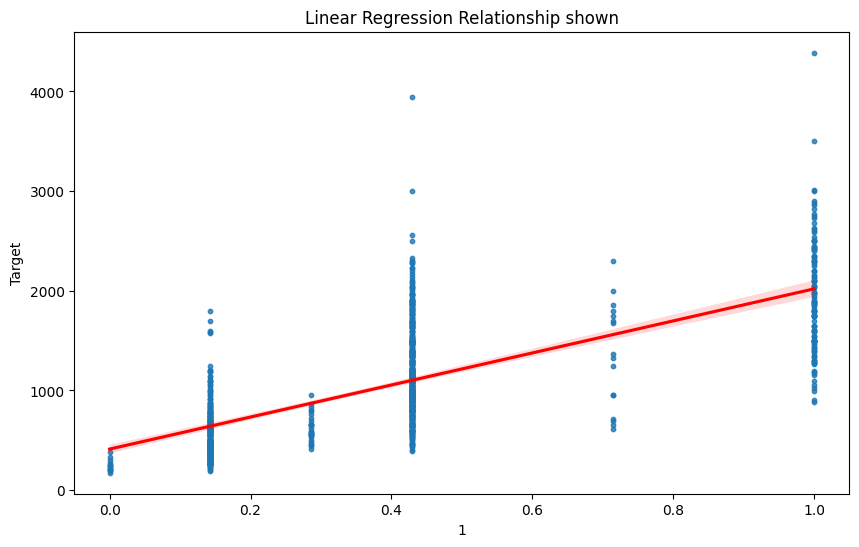

In [ ]:
#Find the feature with the highest correlation and plotting
y_train_series = pd.Series(y_train.ravel(), index=X_train.index)


correlations = X_train.corrwith(y_train_series)
top_feature = correlations.abs().idxmax()
top_corr = correlations[top_feature]

print(f'Top correlated feature with target: {top_feature} (Correlation: {top_corr:.2f})')


plt.figure(figsize=(10, 6))
sns.regplot(x=X_train[top_feature], y=y_train_series, scatter_kws={"s": 10}, line_kws={"color": "red"})
plt.title(f'Linear Regression Relationship shown')
plt.xlabel(top_feature)
plt.ylabel('Target')
plt.show()


##Artificial Neural network

In [ ]:
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

from sklearn.neural_network import MLPRegressor,MLPClassifier
from sklearn.linear_model import Perceptron

In [ ]:
X = df_laptop_cleaned[numerical_features]

y =df_laptop_cleaned[['Price_euros']].values.reshape(-1,1)
y = y.ravel()

scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X))
X.head()

,0,1,2,3,4,5,6,7
0,0.333333,0.428571,0.147757,0.651036,0.787879,0.518519,0.118110,0.0
1,0.333333,0.428571,0.139842,0.040349,0.125000,0.333333,0.118110,0.0
2,0.716667,0.428571,0.277045,0.302072,0.295455,0.592593,0.244094,0.0
3,0.683333,1.000000,0.269129,0.825518,0.977273,0.666667,0.496063,0.0
4,0.333333,0.428571,0.147757,0.651036,0.787879,0.814815,0.244094,0.0


In [ ]:
#Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
X_train.shape

(940, 8)

In [ ]:
multi_reg = MLPRegressor(
    max_iter = 10000,
    hidden_layer_sizes = (20,20,20)

)
# K-Fold cross-validation to avoid overfitting
kf = KFold(n_splits=5, shuffle=True, random_state=123)  # k=5


# Use cross-validation to calculate R^2 and MSE on the training set
cross_val_scores = cross_val_score(multi_reg, X_train, y_train, cv=kf, scoring='r2')
mse_list = []

for train_index, val_index in kf.split(X_train):
    X_cv_train, X_cv_val = X_train.iloc[train_index], X_train.iloc[val_index]
    # Use index of NumPy arrays
    y_cv_train, y_cv_val = y_train[train_index], y_train[val_index]

    multi_reg.fit(X_cv_train, y_cv_train)
    y_cv_val_hat = multi_reg.predict(X_cv_val)
    mse_list.append(mean_squared_error(y_cv_val, y_cv_val_hat))

# Calculate mean MSE
mean_mse_cv = np.mean(mse_list)

# Train the model and evaluate on the test set
multi_reg.fit(X_train, y_train)
y_test_hat = multi_reg.predict(X_test)

mse_test = mean_squared_error(y_test, y_test_hat)

# Output results

print('R^2 on training set:', multi_reg.score(X_train, y_train))
print('Mean R^2 from cross-validation:', np.mean(cross_val_scores))
print('Mean MSE from cross-validation:', mean_mse_cv)
print('R^2 on testing set:', multi_reg.score(X_test, y_test))
print('MSE on testing set:', mse_test)


R^2 on training set: 0.7346647809452278
Mean R^2 from cross-validation: 0.6365930816841667
Mean MSE from cross-validation: 136413.0301762855
R^2 on testing set: 0.7113081358947524
MSE on testing set: 101700.89210539454


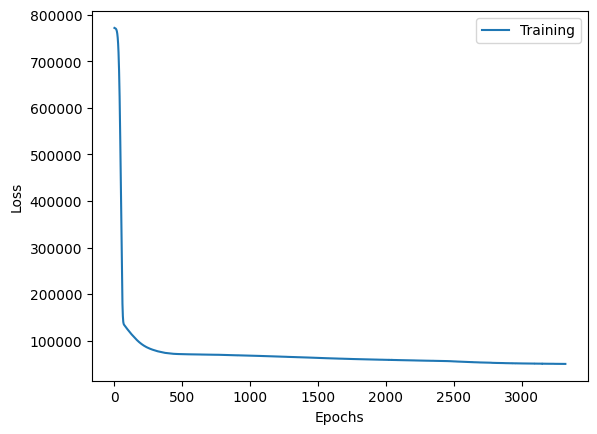

In [ ]:
#Visualize the training loss curve

f,ax = plt.subplots(1,1)
sns.lineplot(
    x = range(len(multi_reg.loss_curve_)),
    y = multi_reg.loss_curve_,
    label = 'Training'
)
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss');

##Random Forest Regressor

R^2 on testing set: 0.7601982763437267


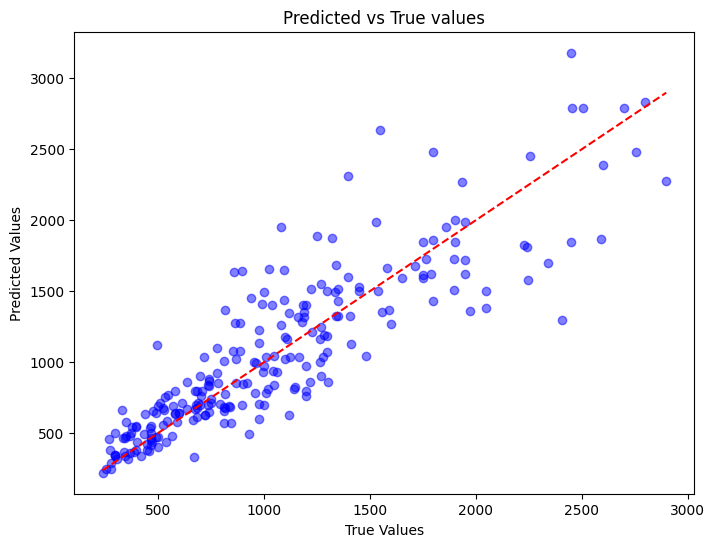

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators = 1000)
model = rf.fit(X_train,y_train)
print('R^2 on testing set:',model.score(X_test,y_test))

y_pred = model.predict(X_test)

#Plotting
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # 对角线
plt.title('Predicted vs True values')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.show()

##CatBoost

In [ ]:
from catboost import CatBoostRegressor, Pool

In [ ]:
#Adjust the hyperparemeters
X = df_laptop.drop(columns=['Price_euros'])
y = df_laptop['Price_euros']

# Split the dataset, 80% for training and 20% for testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Get the column names or indices of categorical variables
# Assume all categorical features are listed here
categorical_features = [
    'Company', 'TypeName', 'OS', 'Screen', 'Touchscreen', 'IPSpanel', 'RetinaDisplay', 'CPU_company',
    'CPU_model', 'PrimaryStorageType', 'SecondaryStorageType', 'GPU_company', 'GPU_model'
]

# Initialize the CatBoost Regressor model
model = CatBoostRegressor(
    iterations=650,          # Set the number of iterations
    learning_rate=0.045,     # Set the learning rate
    depth=6,                 # Set the tree depth
    cat_features=categorical_features,  # Specify the categorical features
    random_state=42,         # Set the random seed for reproducibility
    verbose=200,             # Print progress every 200 iterations
    l2_leaf_reg=5            # Set L2 regularization for leaf nodes
)

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

# Evaluate the model's performance
# Calculate R² score for training set
r2 = r2_score(y_train, y_pred_train)
print(f'R² Score on training set: {r2}')
# Calculate R² score for testing set
r2 = r2_score(y_test, y_pred)
print(f'R² Score on testing set: {r2}')

# Calculate Mean Squared Error (MSE) for training set
mse = mean_squared_error(y_train, y_pred_train)
print(f'Mean Squared Error (MSE) on training set: {mse}')
# Calculate Mean Squared Error (MSE) for testing set
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (MSE) on testing set: {mse}')


0:	learn: 691.0266146	total: 54.6ms	remaining: 35.4s
200:	learn: 241.4589445	total: 1.22s	remaining: 2.72s
400:	learn: 195.6991324	total: 2.41s	remaining: 1.49s
600:	learn: 169.0931795	total: 3.56s	remaining: 291ms
649:	learn: 163.4469008	total: 3.85s	remaining: 0us
R² Score on training set: 0.9297056813020698
R² Score on testing set: 0.8927133667291633
Mean Squared Error (MSE) on training set: 35376.44098271338
Mean Squared Error (MSE) on testing set: 47035.81778905872


#Clustering

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans#kmeans and DBSCAN
from scipy.cluster.hierarchy import dendrogram,linkage#hierarchical clustering
from scipy.spatial.distance import pdist,squareform
from sklearn.decomposition import PCA #PCA
import plotly.express as px

from sklearn.model_selection import train_test_split

In [ ]:
#Import the file
df_apartments=pd.read_csv('apartments_for_rent.csv')

pd.set_option('display.max_columns', None)

df_apartments.head(5)

,id,bathrooms,bedrooms,fee,pets_allowed,price,price_type,square_feet,state,latitude,longitude
0,5.668640e+09,1.0,1.0,No,Cats,2195.0,Monthly,542.0,CA,33.8520,-118.3759
1,5.668640e+09,1.5,3.0,No,"Cats,Dogs",1250.0,Monthly,1500.0,VA,37.0867,-76.4941
2,5.668640e+09,2.0,3.0,No,NaN,1395.0,Monthly,1650.0,NC,35.8230,-78.6438
3,5.668640e+09,1.0,2.0,No,"Cats,Dogs",1600.0,Monthly,820.0,CA,38.3622,-121.9712
4,5.668639e+09,1.0,1.0,No,"Cats,Dogs",975.0,Monthly,624.0,NM,35.1038,-106.6110


##Data Cleaning

In [ ]:
#Check the data type of each column
df_apartments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99492 entries, 0 to 99491
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            99491 non-null  float64
 1   bathrooms     99427 non-null  float64
 2   bedrooms      99365 non-null  float64
 3   fee           99490 non-null  object 
 4   pets_allowed  39066 non-null  object 
 5   price         99491 non-null  float64
 6   price_type    99489 non-null  object 
 7   square_feet   99491 non-null  float64
 8   state         99189 non-null  object 
 9   latitude      99465 non-null  float64
 10  longitude     99466 non-null  float64
dtypes: float64(7), object(4)
memory usage: 8.3+ MB


In [ ]:
df_apartments['price_type'].unique()

array(['Monthly', nan, 'Weekly', 'Monthly|Weekly'], dtype=object)

###Structuring data

In [ ]:
#remove duplicate samples
df_apartments.drop_duplicates(inplace=True)
df_apartments.duplicated().sum()

0

In [ ]:
#Check for NA value
df_apartments.isna().sum()

,0
id,1
bathrooms,65
bedrooms,127
fee,2
pets_allowed,60376
price,1
price_type,3
square_feet,1
state,303
latitude,27


In [ ]:
df_apartments.shape

(99408, 11)

In [ ]:
#Drop the pets_allowed column because it has to many missing values
df_apartments = df_apartments.drop('pets_allowed', axis=1)

In [ ]:
#Drop the NA value samples
df_apartments = df_apartments.dropna()
df_apartments.shape

(98920, 10)

In [ ]:
#Check again for NA value
df_apartments.isna().sum()

,0
id,0
bathrooms,0
bedrooms,0
fee,0
price,0
price_type,0
square_feet,0
state,0
latitude,0
longitude,0


##Data Exploration

In [ ]:
#If price type is paid by week,change the price_type to monthly and also enlarge the price
print(df_apartments['price_type'].unique())
df_apartments[df_apartments['price_type'] == 'Weekly']

['Monthly' 'Weekly']


,id,bathrooms,bedrooms,fee,price,price_type,square_feet,state,latitude,longitude
6729,5.659276e+09,1.0,1.0,No,1560.0,Weekly,200.0,NC,35.0847,-77.0609
49908,5.518370e+09,4.0,4.0,No,8500.0,Weekly,3600.0,NY,41.0020,-72.1796
83395,5.161840e+09,2.5,2.0,No,850.0,Weekly,2326.0,NY,40.7247,-73.9545


In [ ]:
weekly_samples = df_apartments[df_apartments['price_type'] == 'Weekly']

#Enlarge price 4 times and change price_type to 'Monthly'
df_apartments.loc[df_apartments['price_type'] == 'Weekly', 'price'] *= 4.29
df_apartments.loc[df_apartments['price_type'] == 'Weekly', 'price_type'] = 'Monthly'

In [ ]:
print(df_apartments['price_type'].unique())

['Monthly']


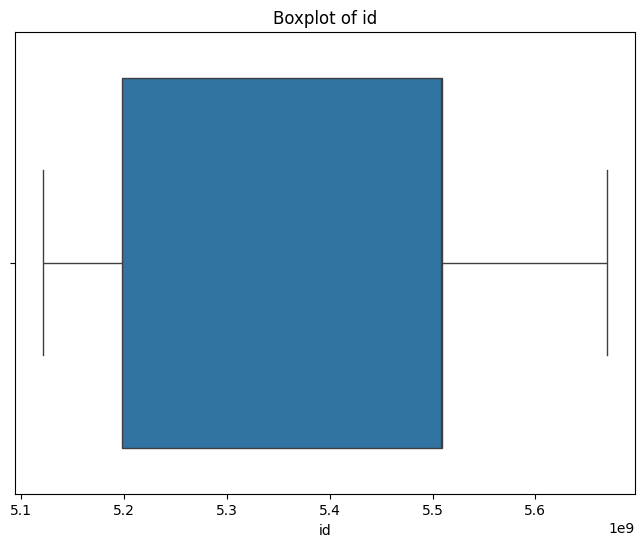

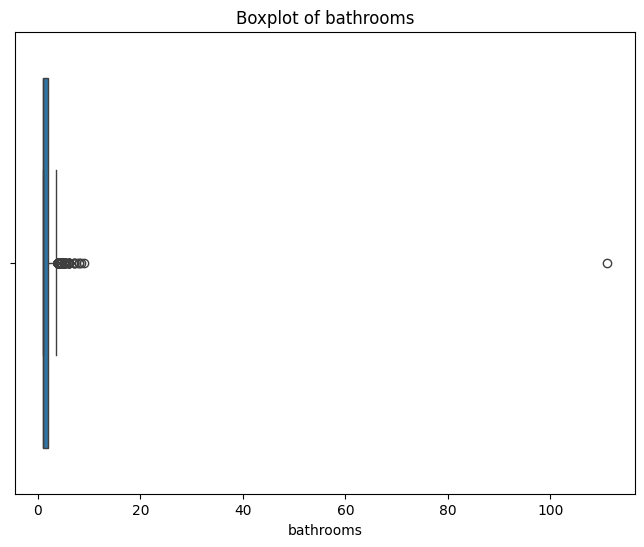

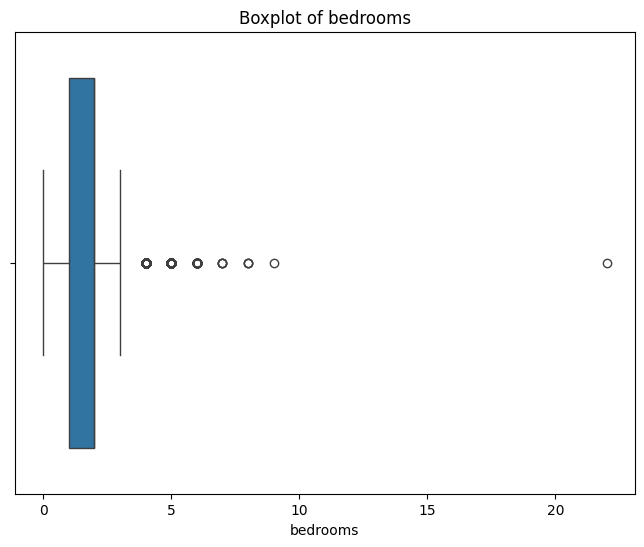

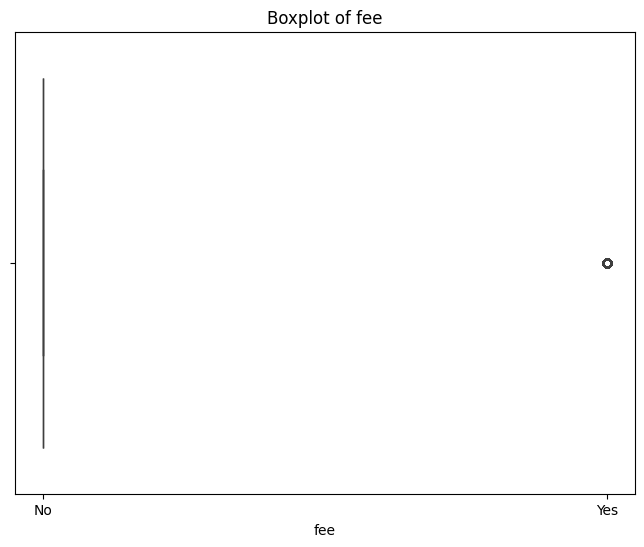

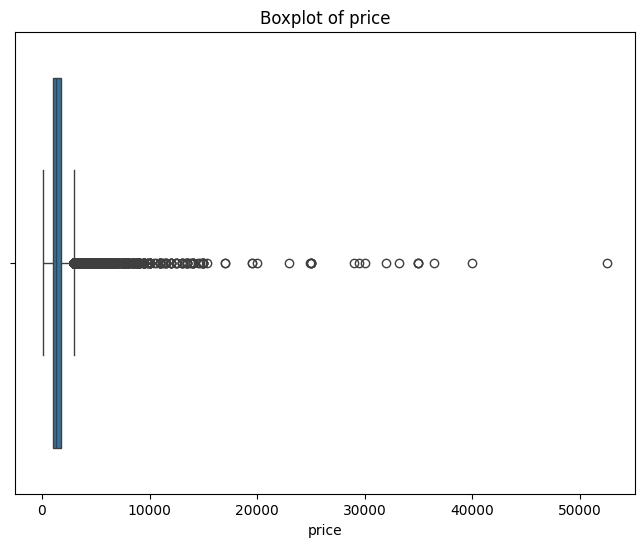

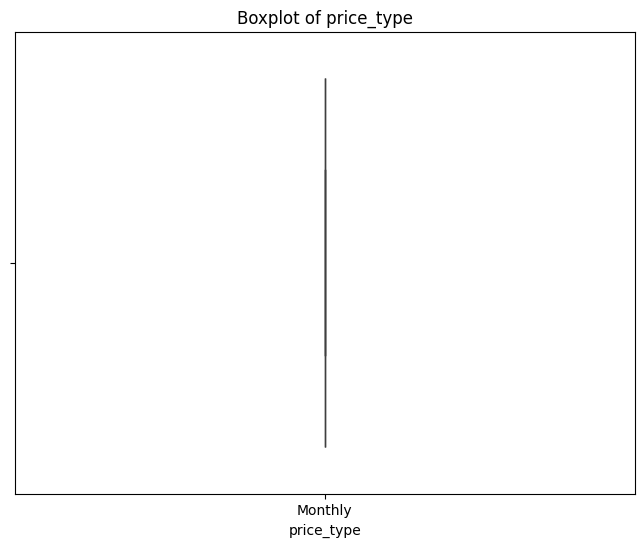

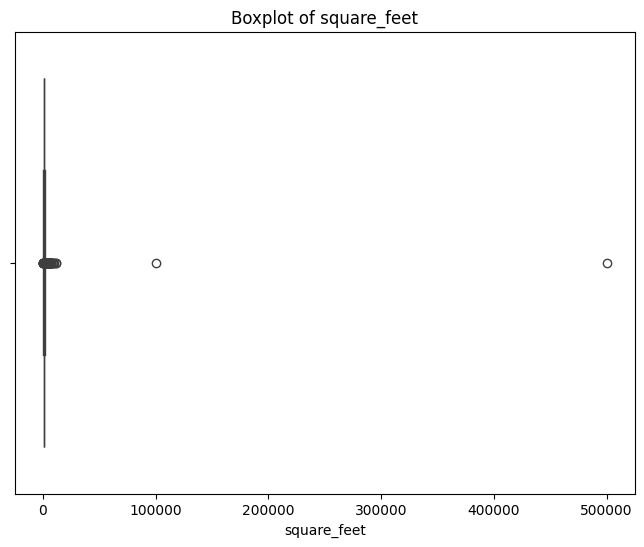

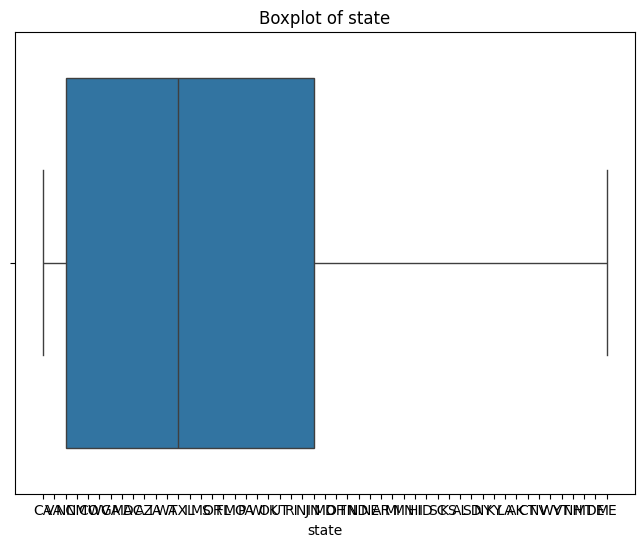

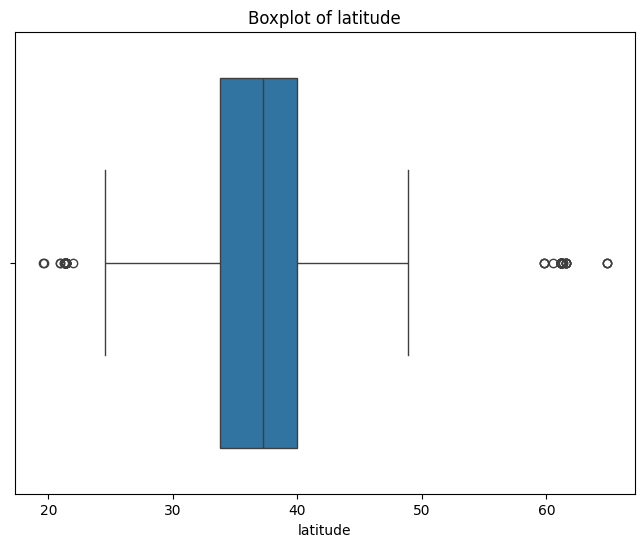

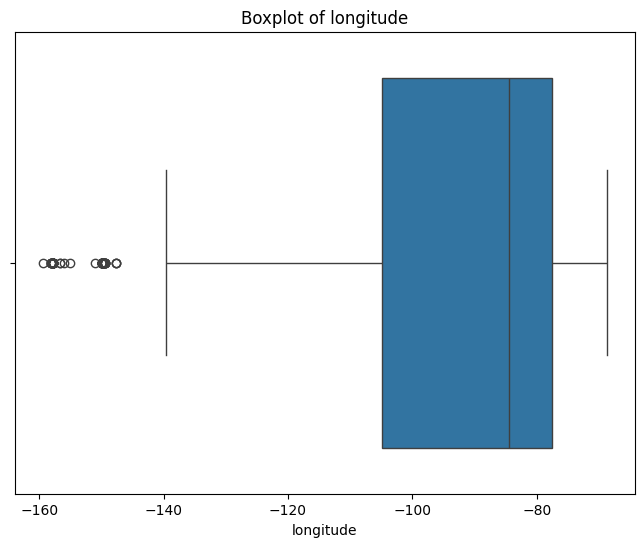

In [ ]:
#Filtering the numerical feature(id is not the numerical feature because it can't be caculated)
numerical_features = ['bathrooms','bedrooms','price','square_feet','latitude','longitude']
for column in df_apartments.columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df_apartments[column])
    plt.title(f'Boxplot of {column}')
    plt.show()

In [ ]:
#Grab outliers
def grab_outliers(df):
 q1=df.quantile(0.25)
 q3=df.quantile(0.75)
 iqr=q3-q1
 outliers=df[((df<(q1-1.5*iqr))|(df>(q3+1.5*iqr)))]
 return outliers


outlier_df = pd.DataFrame()
df_apartments[numerical_features] = df_apartments[numerical_features].astype(float)
for column in numerical_features:
    outliers = grab_outliers(df_apartments[column])
    print(f"Outlier of {column}: {outliers.shape}")
    outlier_df[column] = outliers.reindex(df_apartments[column].index)
outlier_df
non_na_rows_count = (~outlier_df.isna().all(axis=1)).sum()

print(f"Outlier number: {non_na_rows_count}")

Outlier of bathrooms: (203,)
Outlier of bedrooms: (1832,)
Outlier of price: (4622,)
Outlier of square_feet: (2835,)
Outlier of latitude: (88,)
Outlier of longitude: (85,)
Outlier number: 7284


In [ ]:
#Mark outliers
outlier_indices = outlier_df.index[~outlier_df.isna().all(axis=1)]

#Remove outliers from the original dataset
df_apartments_cleaned = df_apartments.drop(index=outlier_indices)

print(f"Original dataset shape: {df_apartments.shape}")
print(f"Cleaned dataset shape: {df_apartments_cleaned.shape}")

Original dataset shape: (98920, 10)
Cleaned dataset shape: (91636, 10)


             bathrooms  bedrooms     price  square_feet  latitude  longitude
bathrooms     1.000000  0.653883  0.241012     0.728126 -0.092652   0.009376
bedrooms      0.653883  1.000000  0.160909     0.686485  0.016042   0.054946
price         0.241012  0.160909  1.000000     0.301577  0.135298  -0.063361
square_feet   0.728126  0.686485  0.301577     1.000000 -0.035720   0.124737
latitude     -0.092652  0.016042  0.135298    -0.035720  1.000000   0.067437
longitude     0.009376  0.054946 -0.063361     0.124737  0.067437   1.000000


<Axes: >

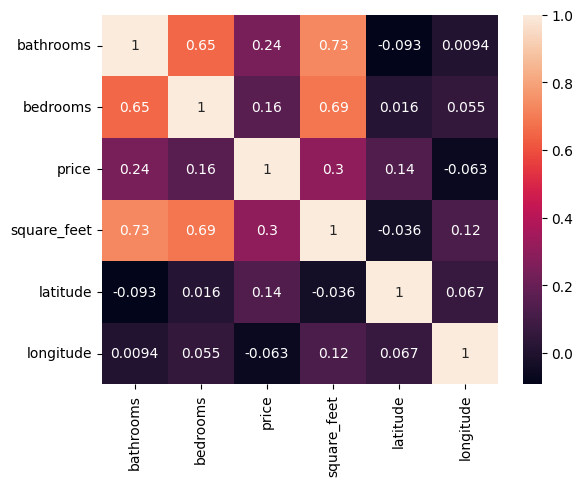

In [ ]:
df = df_apartments_cleaned[numerical_features]
print(df.corr())
sns.heatmap(df.corr(), annot=True)


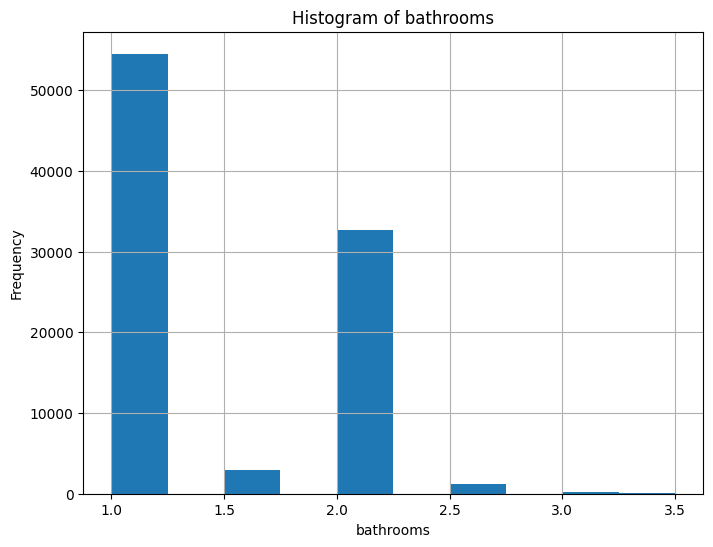

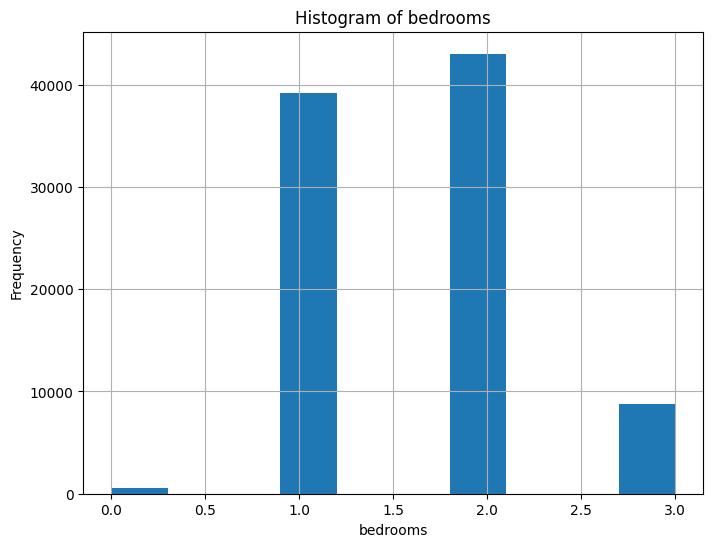

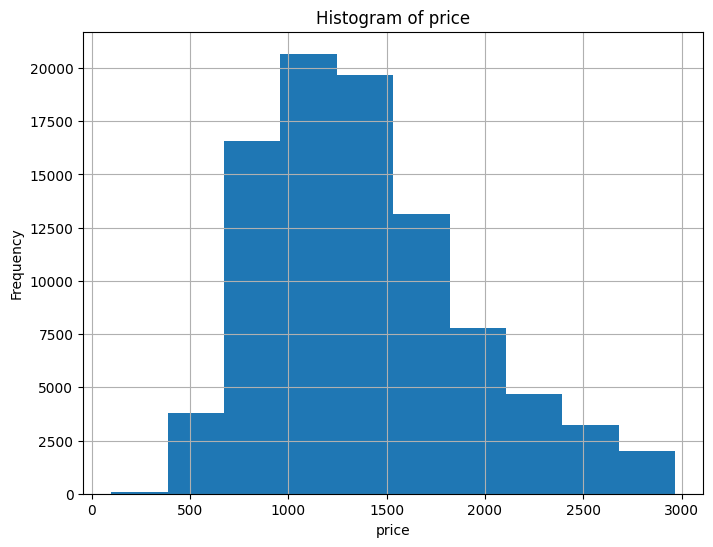

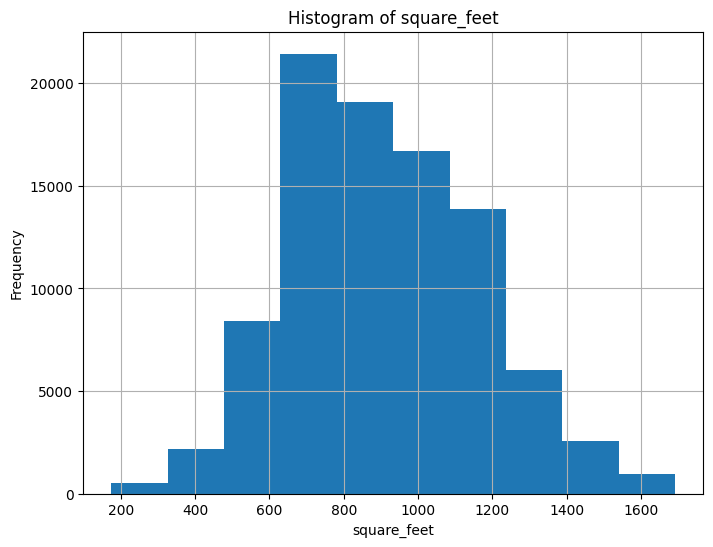

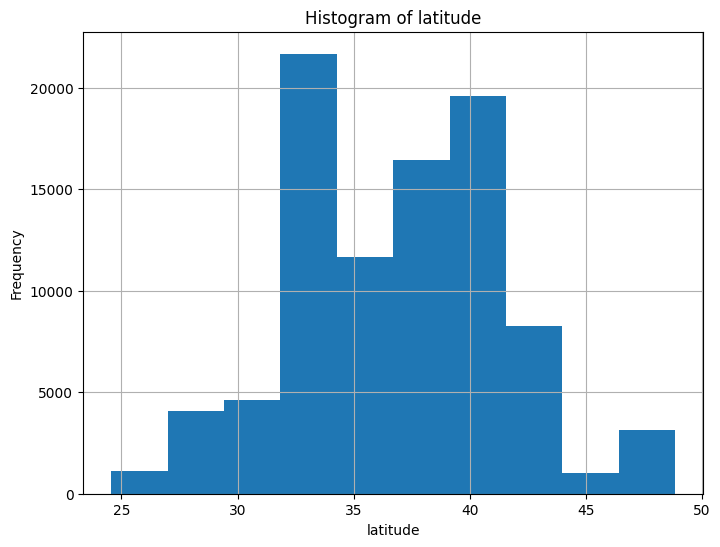

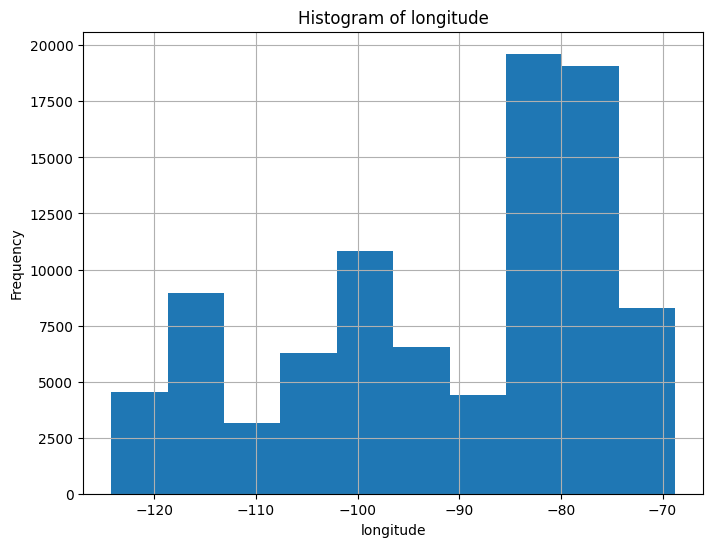

In [ ]:
#Plotting the histogram
for column in df.columns:
    plt.figure(figsize=(8, 6))
    df[column].hist()
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

Summary: I will choose numerical variables as independent variables for clustering. Among these variables, there is a certain correlation between bathroom, bedroom and squarefeet. I may consider using PCA. In addition, the distribution of these features showns different types, some have one peak,some have multiple peaks.

##Kmeans

In [ ]:
#Standardation
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)
df_scaled = pd.DataFrame(df_scaled, columns=df.columns)
df_scaled.head()

,bathrooms,bedrooms,price,square_feet,latitude,longitude
0,-0.799755,-0.997154,1.541006,-1.442567,-0.677089,-1.771617
1,0.203398,2.050008,-0.268595,2.344500,0.034808,0.959018
2,1.206552,2.050008,0.009069,2.937464,-0.243308,0.818861
3,-0.799755,0.526427,0.401628,-0.343606,0.315522,-2.006025
4,-0.799755,-0.997154,-0.795199,-1.118413,-0.401591,-1.004562


[-0.78498406 -0.63855355 -0.2683233  -0.6746633   0.0342898  -0.03164975]
[1 0 0 2 1]


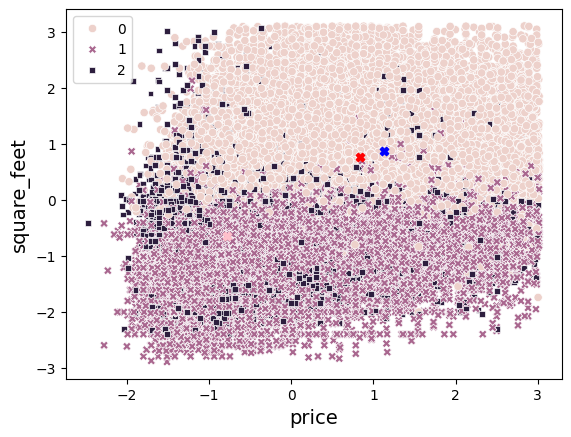

In [ ]:
kmeans_model = KMeans(n_clusters=3)#create the model
kmeans_model = kmeans_model.fit(df_scaled)#train the model
centroids = kmeans_model.cluster_centers_
print(centroids[1])

#save the cluster assignment
clusters = kmeans_model.fit_predict(df_scaled[['bathrooms','bedrooms','price','square_feet','latitude','longitude']])
print(clusters[0:5])

#Visualize the clusters
figure=sns.scatterplot(data=df_scaled,x='price',y='square_feet',hue=clusters,
                       style=clusters);
figure.set_xlabel('price',fontsize=14)
figure.set_ylabel('square_feet',fontsize=14)
#Add centroid for two clusters
plt.scatter(x=centroids[0,0],y=centroids[0,1],c='red',marker='X')
plt.scatter(x=centroids[1,0],y=centroids[1,1],c='pink',marker='X');
plt.scatter(x=centroids[2,0],y=centroids[2,1],c='blue',marker='X');
# plt.scatter(x=centroids[3,0],y=centroids[3,1],c='yellow',marker='X');
df_scaled = df_scaled.copy()
df_scaled.loc[:, 'Cluster'] = clusters

group1 = ['bathrooms','bedrooms','price']
group2 = ['square_feet','latitude','longitude']


fig1 = px.scatter_3d(df_scaled, x=group1[0], y=group1[1], z=group1[2],
                     color='Cluster', title="3D Scatter Plot for Group 1",
                     color_continuous_scale='Viridis')

centroids = kmeans_model.cluster_centers_
for i in range(len(centroids)):
    fig1.add_scatter3d(x=[centroids[i, 0]], y=[centroids[i, 1]], z=[centroids[i, 2]],
                       mode='markers', marker=dict(size=10, color='red', symbol='circle'),showlegend=False)

fig1.show()


fig2 = px.scatter_3d(df_scaled, x=group2[0], y=group2[1], z=group2[2],
                     color='Cluster', title="3D Scatter Plot for Group 2",
                     color_continuous_scale='Viridis')



for i in range(len(centroids)):
    fig2.add_scatter3d(x=[centroids[i, 3]], y=[centroids[i, 4]], z=[centroids[i, 5]],
                       mode='markers', marker=dict(size=10, color='red', symbol='circle'),showlegend=False)

fig2.show()

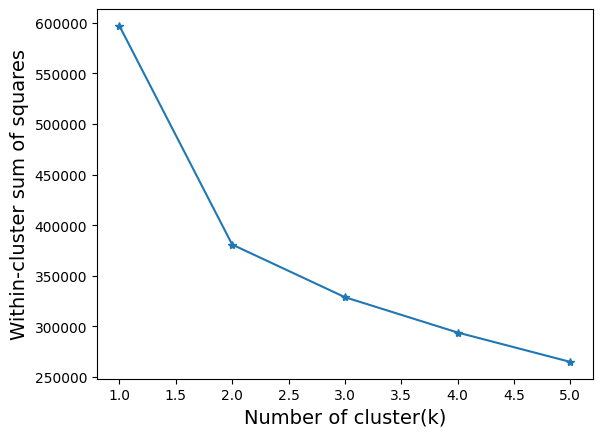

In [ ]:
WCSS =[]
k=[1,2,3,4,5]
for i in k:
  model = KMeans(n_clusters=i)
  model = model.fit(df_scaled)
  WCSS.append(model.inertia_)
#plot
ax=plt.figure().gca()
plt.plot(k,WCSS,'*-')
plt.xlabel('Number of cluster(k)',fontsize=14)
plt.ylabel('Within-cluster sum of squares',fontsize=14);


The above classification seems a bit strange, as we already had prior knowledge that some of the variables exhibit high correlations. We could consider applying PCA.

In [ ]:
#create and fit PCA model
pca_model = PCA(n_components=2)
pca_model.fit(df_scaled)
pca_X=pca_model.transform(df_scaled)

In [ ]:
pca_X = pd.DataFrame(pca_X,columns = ['PC1','PC2'])

pca_X.head()

,PC1,PC2
0,-1.441264,-0.592691
1,2.599437,0.316024
2,3.553293,0.038124
3,-0.736793,0.011197
4,-1.823530,-0.948755


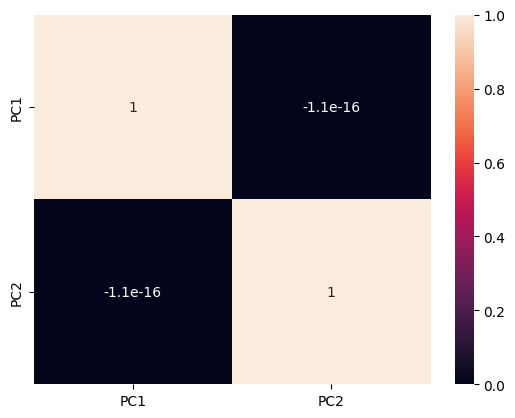

In [ ]:
sns.heatmap(pca_X.corr(),annot= True);

[-1.02623676  0.98257659]
[1 2 2 3 1]


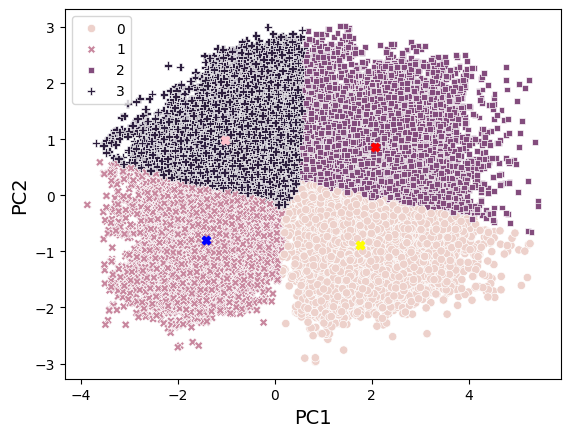

In [ ]:
#Redo for kmean
kmeans_model = KMeans(n_clusters=4)#create the model
kmeans_model = kmeans_model.fit(pca_X)#train the model
centroids = kmeans_model.cluster_centers_
print(centroids[1])

#save the cluster assignment
clusters = kmeans_model.fit_predict(pca_X[['PC1','PC2']])
print(clusters[0:5])

#Visualize the clusters
figure=sns.scatterplot(data=pca_X,x='PC1',y='PC2',hue=clusters,
                       style=clusters);
figure.set_xlabel('PC1',fontsize=14)
figure.set_ylabel('PC2',fontsize=14)
#Add centroid for two clusters
plt.scatter(x=centroids[0,0],y=centroids[0,1],c='red',marker='X')
plt.scatter(x=centroids[1,0],y=centroids[1,1],c='pink',marker='X');
plt.scatter(x=centroids[2,0],y=centroids[2,1],c='blue',marker='X');
plt.scatter(x=centroids[3,0],y=centroids[3,1],c='yellow',marker='X');

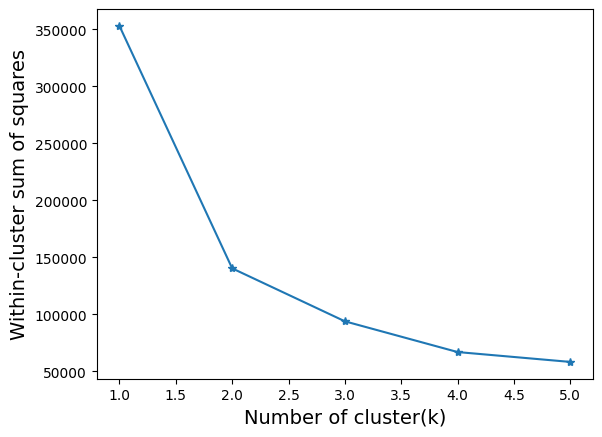

In [ ]:
WCSS =[]
k=[1,2,3,4,5]
for i in k:
  model = KMeans(n_clusters=i)
  model = model.fit(pca_X)
  WCSS.append(model.inertia_)
#plot
ax=plt.figure().gca()
plt.plot(k,WCSS,'*-')
plt.xlabel('Number of cluster(k)',fontsize=14)
plt.ylabel('Within-cluster sum of squares',fontsize=14);

##Hierarchical model

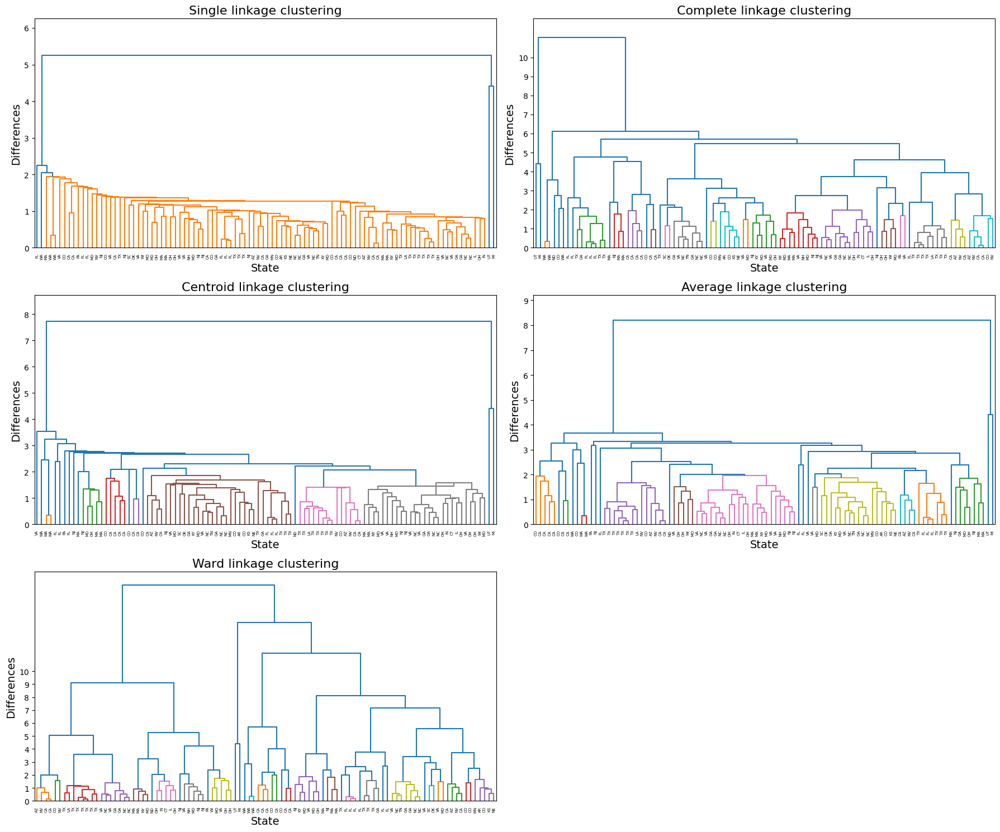

In [ ]:
#Format the data as distance matrix
data = df_apartments[['bathrooms','bedrooms','price','square_feet','latitude','longitude','state']]

data_100_unscaled, _ = train_test_split(data, train_size=100, stratify=data['state'], random_state=42) #Selection based on states
data_100_unscaled = pd.DataFrame(data_100_unscaled, columns=['bathrooms','bedrooms','price','square_feet','latitude','longitude','state'])
modeldata_100 = data_100_unscaled.drop(columns=['state'])

#Standardization
scaler = StandardScaler()
data_100 = scaler.fit_transform(modeldata_100)
data_100 = pd.DataFrame(data_100, columns=['bathrooms','bedrooms','price','square_feet','latitude','longitude'])

feature_data = data_100[['bathrooms','bedrooms','price','square_feet','latitude','longitude']]
distance_vector = pdist(feature_data)


distance_data = squareform(distance_vector)

# Define clustering models with different linkage methods
linkage_methods = ['single', 'complete', 'centroid', 'average', 'ward']
linkage_models = {method: linkage(distance_vector, method=method) for method in linkage_methods}

# Create the dendrograms
plt.figure(figsize=(18, 15))

# Loop through each linkage method and plot its dendrogram
for i, method in enumerate(linkage_methods, 1):
    plt.subplot(3, 2, i)  # Create a grid of subplots (3 rows, 2 columns)

    # Generate the dendrogram for the current method
    dendrogram(
        linkage_models[method],
        labels=data_100_unscaled['state'].astype(str).values,
        leaf_rotation=90,
        color_threshold=2
    )

    # Customize each subplot
    plt.ylabel('Differences', fontsize=14)
    plt.xlabel('State', fontsize=14)
    plt.title(f'{method.capitalize()} linkage clustering', fontsize=16)
    plt.yticks(np.arange(0, 11, step=1))
    max_distance = max(linkage_models[method][:, 2])
    plt.ylim(0, max_distance + 1)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [ ]:
#Also try using PCA and compare

#create and fit PCA model

pca_model = PCA(n_components=2)
pca_model.fit(data_100)
pca_X=pca_model.transform(data_100)

In [ ]:
pca_X = pd.DataFrame(pca_X,columns = ['PC1','PC2'])

pca_X.head()

,PC1,PC2
0,1.707160,-2.282959
1,-1.790918,0.820485
2,0.804707,-1.279517
3,-1.473686,1.170675
4,-1.291449,-0.983802


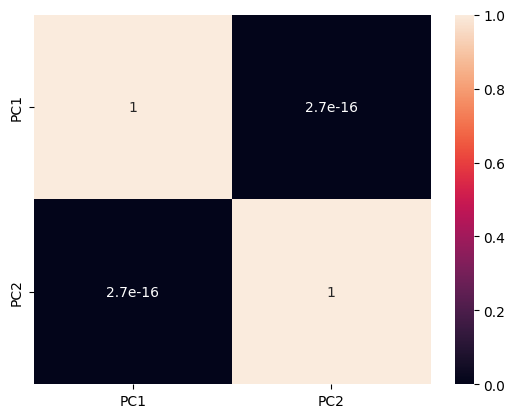

In [ ]:
sns.heatmap(pca_X.corr(),annot= True);

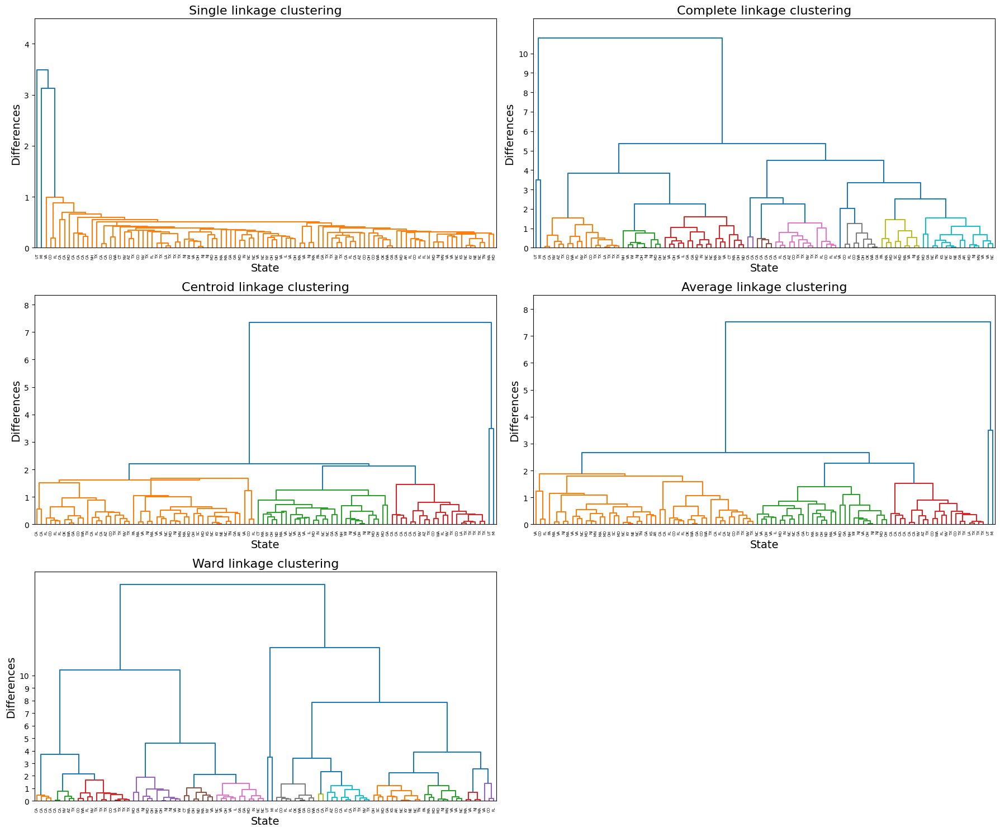

In [ ]:
feature_data = pca_X[['PC1','PC2']]
distance_vector = pdist(feature_data)


distance_data = squareform(distance_vector)

# Define clustering models with different linkage methods
linkage_methods = ['single', 'complete', 'centroid', 'average', 'ward']
linkage_models = {method: linkage(distance_vector, method=method) for method in linkage_methods}

# Create the dendrograms
plt.figure(figsize=(18, 15))

# Loop through each linkage method and plot its dendrogram
for i, method in enumerate(linkage_methods, 1):
    plt.subplot(3, 2, i)  # Create a grid of subplots (3 rows, 2 columns)

    # Generate the dendrogram for the current method
    dendrogram(
        linkage_models[method],
        labels=data_100_unscaled['state'].astype(str).values,
        leaf_rotation=90,
        color_threshold=2
    )

    # Customize each subplot
    plt.ylabel('Differences', fontsize=14)
    plt.xlabel('State', fontsize=14)
    plt.title(f'{method.capitalize()} linkage clustering', fontsize=16)
    plt.yticks(np.arange(0, 11, step=1))
    max_distance = max(linkage_models[method][:, 2])
    plt.ylim(0, max_distance + 1)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()